In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Chikk\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
df=pd.read_csv('tourist_accommodation_reviews.csv',encoding='cp1252')

In [3]:
df

,ID,Review Date,Location,Hotel/Restaurant name,Review
0,rn579778340,Reviewed 1 week ago,Kathu,Thong Dee The Kathu Brasserie,Just been for sunday roast lamb and beef truly...
1,rn576350875,Reviewed 3 weeks ago,Kathu,Thong Dee The Kathu Brasserie,"Quietly set off the main road, nice atmosphere..."
2,rn574921678,Reviewed 4 weeks ago,Kathu,Thong Dee The Kathu Brasserie,I made a reservation for a birthday two days i...
3,rn572905503,"Reviewed April 12, 2018",Kathu,Thong Dee The Kathu Brasserie,We visit here regularly and never fail to be i...
4,rn572364712,"Reviewed April 10, 2018",Kathu,Thong Dee The Kathu Brasserie,Visited this wonderful place on my travels and...
...,...,...,...,...,...
53639,rn162368197,"Reviewed May 29, 2013",Patong,Bite in,"I love this small restaurant, for the great fo..."
53640,rn161843734,"Reviewed May 25, 2013",Patong,Bite in,We stopped at this restaurant after shopping a...
53641,rn161734077,"Reviewed May 24, 2013",Patong,Bite in,"Great times ,This is one of the best restauran..."
53642,rn161218072,"Reviewed May 19, 2013",Patong,Bite in,"Bite in, it has become my favorite restaurant ..."


In [4]:
df.isnull().sum()

ID                       0
Review Date              0
Location                 0
Hotel/Restaurant name    0
Review                   0
dtype: int64

In [5]:
data=df.drop_duplicates()

In [6]:
data

,ID,Review Date,Location,Hotel/Restaurant name,Review
0,rn579778340,Reviewed 1 week ago,Kathu,Thong Dee The Kathu Brasserie,Just been for sunday roast lamb and beef truly...
1,rn576350875,Reviewed 3 weeks ago,Kathu,Thong Dee The Kathu Brasserie,"Quietly set off the main road, nice atmosphere..."
2,rn574921678,Reviewed 4 weeks ago,Kathu,Thong Dee The Kathu Brasserie,I made a reservation for a birthday two days i...
3,rn572905503,"Reviewed April 12, 2018",Kathu,Thong Dee The Kathu Brasserie,We visit here regularly and never fail to be i...
4,rn572364712,"Reviewed April 10, 2018",Kathu,Thong Dee The Kathu Brasserie,Visited this wonderful place on my travels and...
...,...,...,...,...,...
53639,rn162368197,"Reviewed May 29, 2013",Patong,Bite in,"I love this small restaurant, for the great fo..."
53640,rn161843734,"Reviewed May 25, 2013",Patong,Bite in,We stopped at this restaurant after shopping a...
53641,rn161734077,"Reviewed May 24, 2013",Patong,Bite in,"Great times ,This is one of the best restauran..."
53642,rn161218072,"Reviewed May 19, 2013",Patong,Bite in,"Bite in, it has become my favorite restaurant ..."


In [7]:
print(data["Location"].unique())

[' Kathu' ' Kata Beach' ' Rawai' ' Choeng Thale' ' Karon Beach'
 ' Phuket Town' ' Patong' ' Mai Khao' ' Karon' ' Chalong' ' Nai Harn'
 ' Cape Panwa' ' Sakhu' ' Pa Khlok' ' Kamala' ' Bang Tao Beach'
 ' Thalang District' ' Talat Nuea' ' Kata Noi Beach' ' Wichit' ' Nai Yang'
 ' Talat Yai' ' Koh Kaew' ' Nai Thon' ' Ratsada']


In [8]:
data['Location'].value_counts()

 Patong              15112
 Kata Beach           5433
 Karon                5296
 Rawai                3471
 Choeng Thale         3218
 Phuket Town          3126
 Kamala               2932
 Mai Khao             2242
 Cape Panwa           1500
 Chalong              1197
 Thalang District     1067
 Kathu                1018
 Nai Yang              986
 Nai Harn              801
 Bang Tao Beach        600
 Wichit                375
 Karon Beach           367
 Talat Yai             300
 Koh Kaew              293
 Kata Noi Beach        200
 Pa Khlok              100
 Ratsada                88
 Nai Thon               84
 Talat Nuea             77
 Sakhu                  61
Name: Location, dtype: int64

# Selecting the locations with highest  counts

In [9]:
p_data=df[df.Location.str.contains('Patong')]

In [10]:
p_data

,ID,Review Date,Location,Hotel/Restaurant name,Review
793,rn578272599,Reviewed 2 weeks ago,Patong,Sam's Steaks and Grill,its very expensive in comparison to other loca...
794,rn576707124,Reviewed 2 weeks ago,Patong,Sam's Steaks and Grill,We walked passed the holiday inn and decided a...
795,rn576151146,Reviewed 3 weeks ago,Patong,Sam's Steaks and Grill,"An atmosphere of the 70's, great comfort of th..."
796,rn575977118,Reviewed 3 weeks ago,Patong,Sam's Steaks and Grill,We made a reservation at the last minute to di...
797,rn574931000,Reviewed 4 weeks ago,Patong,Sam's Steaks and Grill,We had a very great time to celebrate my son b...
...,...,...,...,...,...
53639,rn162368197,"Reviewed May 29, 2013",Patong,Bite in,"I love this small restaurant, for the great fo..."
53640,rn161843734,"Reviewed May 25, 2013",Patong,Bite in,We stopped at this restaurant after shopping a...
53641,rn161734077,"Reviewed May 24, 2013",Patong,Bite in,"Great times ,This is one of the best restauran..."
53642,rn161218072,"Reviewed May 19, 2013",Patong,Bite in,"Bite in, it has become my favorite restaurant ..."


In [11]:
p_data=p_data.drop_duplicates(keep='first').reset_index(drop=True)
p_data

,ID,Review Date,Location,Hotel/Restaurant name,Review
0,rn578272599,Reviewed 2 weeks ago,Patong,Sam's Steaks and Grill,its very expensive in comparison to other loca...
1,rn576707124,Reviewed 2 weeks ago,Patong,Sam's Steaks and Grill,We walked passed the holiday inn and decided a...
2,rn576151146,Reviewed 3 weeks ago,Patong,Sam's Steaks and Grill,"An atmosphere of the 70's, great comfort of th..."
3,rn575977118,Reviewed 3 weeks ago,Patong,Sam's Steaks and Grill,We made a reservation at the last minute to di...
4,rn574931000,Reviewed 4 weeks ago,Patong,Sam's Steaks and Grill,We had a very great time to celebrate my son b...
...,...,...,...,...,...
15107,rn162368197,"Reviewed May 29, 2013",Patong,Bite in,"I love this small restaurant, for the great fo..."
15108,rn161843734,"Reviewed May 25, 2013",Patong,Bite in,We stopped at this restaurant after shopping a...
15109,rn161734077,"Reviewed May 24, 2013",Patong,Bite in,"Great times ,This is one of the best restauran..."
15110,rn161218072,"Reviewed May 19, 2013",Patong,Bite in,"Bite in, it has become my favorite restaurant ..."


In [12]:
p_data

,ID,Review Date,Location,Hotel/Restaurant name,Review
0,rn578272599,Reviewed 2 weeks ago,Patong,Sam's Steaks and Grill,its very expensive in comparison to other loca...
1,rn576707124,Reviewed 2 weeks ago,Patong,Sam's Steaks and Grill,We walked passed the holiday inn and decided a...
2,rn576151146,Reviewed 3 weeks ago,Patong,Sam's Steaks and Grill,"An atmosphere of the 70's, great comfort of th..."
3,rn575977118,Reviewed 3 weeks ago,Patong,Sam's Steaks and Grill,We made a reservation at the last minute to di...
4,rn574931000,Reviewed 4 weeks ago,Patong,Sam's Steaks and Grill,We had a very great time to celebrate my son b...
...,...,...,...,...,...
15107,rn162368197,"Reviewed May 29, 2013",Patong,Bite in,"I love this small restaurant, for the great fo..."
15108,rn161843734,"Reviewed May 25, 2013",Patong,Bite in,We stopped at this restaurant after shopping a...
15109,rn161734077,"Reviewed May 24, 2013",Patong,Bite in,"Great times ,This is one of the best restauran..."
15110,rn161218072,"Reviewed May 19, 2013",Patong,Bite in,"Bite in, it has become my favorite restaurant ..."


In [13]:
p_data['Hotel/Restaurant name'].value_counts().to_frame()

,Hotel/Restaurant name
No.6 Restaurant,200
Da Mario,107
Sam's Steaks and Grill,100
Sala Bua Restaurant,100
Pizzeria Hut 1,100
...,...
The Green Gourmet,36
Bucintoro Pizzeria-Ristorante,26
Baoli,19
Baia Del Sole,12


In [14]:
p_data['Hotel/Restaurant name'].unique()

array(["Sam's Steaks and Grill", 'Highway Curry Indian & Thai Cuisine',
       'Ao Chalong Yacht Club Restaurant', "Naughty Nuri's Phuket",
       'Natural Efe Macrobiotic World', 'Sizzle Rooftop Restaurant',
       'Climax on Bangla', 'Le Brooklyn Patong',
       'La Dolce Vita Restaurant', 'i-Kroon Cafe',
       'Salute Italian Restaurant', 'Rustic - Eatery & Bar',
       'Austrian Garden Restaurant', 'Trattoria Capri da Rico', 'Vista',
       'The Blue Mango Bar and Grill', 'La Gritta',
       'Sandwich Shoppe Cafe & Bar Patong Phuket',
       'Halfway Inn (Restaurant)', 'ICC Indian Curry Club',
       "Rosco's Restaurant & Sports Bar",
       'BYD Lofts Restaurant Bistro & Bar', 'Home Dining Cafe & Lounge',
       'Soul Curry Restaurant and Bar',
       'Kantok Restaurant at Burasari Resort', 'Poo Nurntong Restaurant',
       'EuroThai Restaurant', 'No 9 2nd Restaurant', 'Pizzeria Da Moreno',
       'YamThai Restaurant', 'Golbasi', 'Two Chefs Patong',
       'Thai Smile 2', 'Restau

In [15]:
restaurant_lst=["Sam's Steaks and Grill", "Highway Curry Indian & Thai Cuisine","Ao Chalong Yacht Club Restaurant",
"Naughty Nuri's Phuket","Natural Efe Macrobiotic World", "Sizzle Rooftop Restaurant","Climax on Bangla",
"Le Brooklyn Patong","La Dolce Vita Restaurant","i-Kroon Cafe","Salute Italian Restaurant","Rustic - Eatery & Bar",
"Austrian Garden Restaurant","Trattoria Capri da Rico","Vista","The Blue Mango Bar and Grill","La Gritta",
"Sandwich Shoppe Cafe & Bar Patong Phuket","Halfway Inn (Restaurant)","ICC Indian Curry Club",
"Rosco's Restaurant & Sports Bar","BYD Lofts Restaurant Bistro & Bar","Home Dining Cafe & Lounge","Soul Curry Restaurant and Bar",
"Kantok Restaurant at Burasari Resort","Poo Nurntong Restaurant","EuroThai Restaurant","No 9 2nd Restaurant", "Pizzeria Da Moreno",
"YamThai Restaurant"]

In [16]:
print(len(restaurant_lst))

30


In [17]:
 def extractrestaurantnames(x):
    if x in  restaurant_lst:
        return x
    else:
        return ''
p_data['Restaurants'] = p_data['Hotel/Restaurant name'].apply(lambda x : extractrestaurantnames(x))

In [18]:
p_data

,ID,Review Date,Location,Hotel/Restaurant name,Review,Restaurants
0,rn578272599,Reviewed 2 weeks ago,Patong,Sam's Steaks and Grill,its very expensive in comparison to other loca...,Sam's Steaks and Grill
1,rn576707124,Reviewed 2 weeks ago,Patong,Sam's Steaks and Grill,We walked passed the holiday inn and decided a...,Sam's Steaks and Grill
2,rn576151146,Reviewed 3 weeks ago,Patong,Sam's Steaks and Grill,"An atmosphere of the 70's, great comfort of th...",Sam's Steaks and Grill
3,rn575977118,Reviewed 3 weeks ago,Patong,Sam's Steaks and Grill,We made a reservation at the last minute to di...,Sam's Steaks and Grill
4,rn574931000,Reviewed 4 weeks ago,Patong,Sam's Steaks and Grill,We had a very great time to celebrate my son b...,Sam's Steaks and Grill
...,...,...,...,...,...,...
15107,rn162368197,"Reviewed May 29, 2013",Patong,Bite in,"I love this small restaurant, for the great fo...",
15108,rn161843734,"Reviewed May 25, 2013",Patong,Bite in,We stopped at this restaurant after shopping a...,
15109,rn161734077,"Reviewed May 24, 2013",Patong,Bite in,"Great times ,This is one of the best restauran...",
15110,rn161218072,"Reviewed May 19, 2013",Patong,Bite in,"Bite in, it has become my favorite restaurant ...",


In [19]:
final_data=p_data.drop(['Hotel/Restaurant name'], axis=1)

In [20]:
final_data

,ID,Review Date,Location,Review,Restaurants
0,rn578272599,Reviewed 2 weeks ago,Patong,its very expensive in comparison to other loca...,Sam's Steaks and Grill
1,rn576707124,Reviewed 2 weeks ago,Patong,We walked passed the holiday inn and decided a...,Sam's Steaks and Grill
2,rn576151146,Reviewed 3 weeks ago,Patong,"An atmosphere of the 70's, great comfort of th...",Sam's Steaks and Grill
3,rn575977118,Reviewed 3 weeks ago,Patong,We made a reservation at the last minute to di...,Sam's Steaks and Grill
4,rn574931000,Reviewed 4 weeks ago,Patong,We had a very great time to celebrate my son b...,Sam's Steaks and Grill
...,...,...,...,...,...
15107,rn162368197,"Reviewed May 29, 2013",Patong,"I love this small restaurant, for the great fo...",
15108,rn161843734,"Reviewed May 25, 2013",Patong,We stopped at this restaurant after shopping a...,
15109,rn161734077,"Reviewed May 24, 2013",Patong,"Great times ,This is one of the best restauran...",
15110,rn161218072,"Reviewed May 19, 2013",Patong,"Bite in, it has become my favorite restaurant ...",


In [21]:
final_data.isnull().sum()

ID             0
Review Date    0
Location       0
Review         0
Restaurants    0
dtype: int64

In [22]:
final_subset=final_data[['ID', 'Review']].copy()

In [23]:
final_subset.head(4)

,ID,Review
0,rn578272599,its very expensive in comparison to other loca...
1,rn576707124,We walked passed the holiday inn and decided a...
2,rn576151146,"An atmosphere of the 70's, great comfort of th..."
3,rn575977118,We made a reservation at the last minute to di...


In [24]:
#Cleaning the review column removing unnecessary characters

In [25]:
final_subset['Review'] = final_subset['Review'].str.replace("[^a-zA-Z#]", " ")
final_subset['Review'] = final_subset['Review'].str.casefold()

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\148984360.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  final_subset['Review'] = final_subset['Review'].str.replace("[^a-zA-Z#]", " ")


In [26]:
final_subset

,ID,Review
0,rn578272599,its very expensive in comparison to other loca...
1,rn576707124,we walked passed the holiday inn and decided a...
2,rn576151146,an atmosphere of the s great comfort of th...
3,rn575977118,we made a reservation at the last minute to di...
4,rn574931000,we had a very great time to celebrate my son b...
...,...,...
15107,rn162368197,i love this small restaurant for the great fo...
15108,rn161843734,we stopped at this restaurant after shopping a...
15109,rn161734077,great times this is one of the best restauran...
15110,rn161218072,bite in it has become my favorite restaurant ...


In [27]:
final1=pd.DataFrame()
final1['ID']=['99999999999']
final1['review_type']='NA999NA'
final1['review_score']=0

In [28]:
s_analyzer = SentimentIntensityAnalyzer()

In [29]:
t_df = final1
for index, row in final_subset.iterrows():
    scores = s_analyzer.polarity_scores(row[1])
    for key, value in scores.items():
        temp = [key,value,row[0]]
        final1['ID']=row[0]
        final1['review_type']=key
        final1['review_score']=value
        t_df=t_df.append(final1)
t_df_clean = t_df[t_df.ID != '99999999999']
t_df_clean= t_df_clean.drop_duplicates()
t_df_clean = t_df[t_df.review_type == 'compound']

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(final1)
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\1133299576.py:9: FutureWarning: The frame.

In [30]:
data_output = pd.merge(final_data, t_df_clean, on='ID', how='inner')


In [31]:
data_output

,ID,Review Date,Location,Review,Restaurants,review_type,review_score
0,rn578272599,Reviewed 2 weeks ago,Patong,its very expensive in comparison to other loca...,Sam's Steaks and Grill,compound,0.8674
1,rn576707124,Reviewed 2 weeks ago,Patong,We walked passed the holiday inn and decided a...,Sam's Steaks and Grill,compound,0.3818
2,rn576151146,Reviewed 3 weeks ago,Patong,"An atmosphere of the 70's, great comfort of th...",Sam's Steaks and Grill,compound,0.9839
3,rn575977118,Reviewed 3 weeks ago,Patong,We made a reservation at the last minute to di...,Sam's Steaks and Grill,compound,0.9559
4,rn574931000,Reviewed 4 weeks ago,Patong,We had a very great time to celebrate my son b...,Sam's Steaks and Grill,compound,0.9258
...,...,...,...,...,...,...,...
15107,rn162368197,"Reviewed May 29, 2013",Patong,"I love this small restaurant, for the great fo...",,compound,0.9776
15108,rn161843734,"Reviewed May 25, 2013",Patong,We stopped at this restaurant after shopping a...,,compound,0.2263
15109,rn161734077,"Reviewed May 24, 2013",Patong,"Great times ,This is one of the best restauran...",,compound,0.9636
15110,rn161218072,"Reviewed May 19, 2013",Patong,"Bite in, it has become my favorite restaurant ...",,compound,0.9853


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]),
 [Text(0, 0, "Sam's Steaks and Grill"),
  Text(1, 0, 'Highway Curry Indian & Thai Cuisine'),
  Text(2, 0, 'Ao Chalong Yacht Club Restaurant'),
  Text(3, 0, "Naughty Nuri's Phuket"),
  Text(4, 0, 'Natural Efe Macrobiotic World'),
  Text(5, 0, 'Sizzle Rooftop Restaurant'),
  Text(6, 0, 'Climax on Bangla'),
  Text(7, 0, 'Le Brooklyn Patong'),
  Text(8, 0, 'La Dolce Vita Restaurant'),
  Text(9, 0, 'i-Kroon Cafe'),
  Text(10, 0, 'Salute Italian Restaurant'),
  Text(11, 0, 'Rustic - Eatery & Bar'),
  Text(12, 0, 'Austrian Garden Restaurant'),
  Text(13, 0, 'Trattoria Capri da Rico'),
  Text(14, 0, 'Vista'),
  Text(15, 0, 'The Blue Mango Bar and Grill'),
  Text(16, 0, 'La Gritta'),
  Text(17, 0, 'Sandwich Shoppe Cafe & Bar Patong Phuket'),
  Text(18, 0, 'Halfway Inn (Restaurant)'),
  Text(19, 0, 'ICC Indian Curry Club'),
  Text(20, 0, "Rosco's Restauran

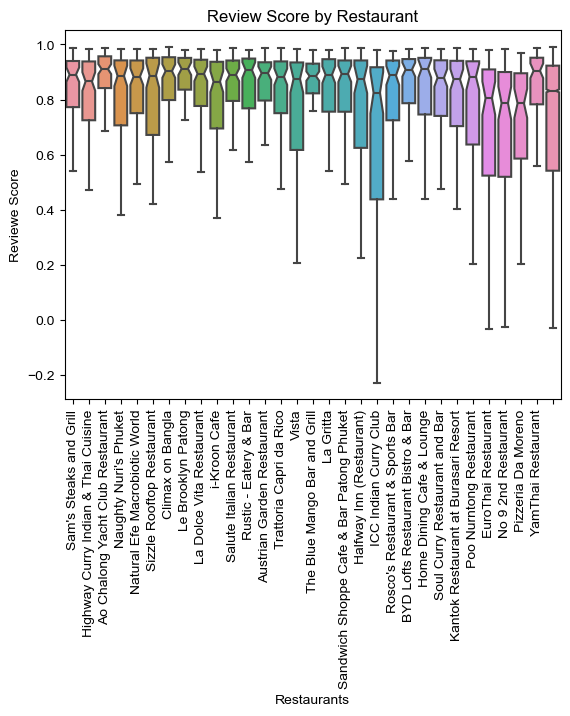

In [32]:
sns.boxplot(x='Restaurants', y='review_score', notch = True,
            data=data_output, showfliers=False).set(title='Review Score by Restaurant')
plt.xlabel('Restaurants')
plt.ylabel('Reviewe Score')
sns.set(rc={"figure.figsize":(10, 10)})
plt.xticks(rotation=90)

In [33]:
data_output=data_output.drop(['review_type'], axis=1)

In [34]:
data_output

,ID,Review Date,Location,Review,Restaurants,review_score
0,rn578272599,Reviewed 2 weeks ago,Patong,its very expensive in comparison to other loca...,Sam's Steaks and Grill,0.8674
1,rn576707124,Reviewed 2 weeks ago,Patong,We walked passed the holiday inn and decided a...,Sam's Steaks and Grill,0.3818
2,rn576151146,Reviewed 3 weeks ago,Patong,"An atmosphere of the 70's, great comfort of th...",Sam's Steaks and Grill,0.9839
3,rn575977118,Reviewed 3 weeks ago,Patong,We made a reservation at the last minute to di...,Sam's Steaks and Grill,0.9559
4,rn574931000,Reviewed 4 weeks ago,Patong,We had a very great time to celebrate my son b...,Sam's Steaks and Grill,0.9258
...,...,...,...,...,...,...
15107,rn162368197,"Reviewed May 29, 2013",Patong,"I love this small restaurant, for the great fo...",,0.9776
15108,rn161843734,"Reviewed May 25, 2013",Patong,We stopped at this restaurant after shopping a...,,0.2263
15109,rn161734077,"Reviewed May 24, 2013",Patong,"Great times ,This is one of the best restauran...",,0.9636
15110,rn161218072,"Reviewed May 19, 2013",Patong,"Bite in, it has become my favorite restaurant ...",,0.9853


In [35]:
data_output[['review_score']].describe()

,review_score
count,15112.000000
mean,0.656438
std,0.428206
min,-0.970400
25%,0.581650
50%,0.844200
75%,0.927225
max,0.992200


In [36]:
#Positive  -- 0.99
#Negative -- -0.97
#Neutral -- 0.65

In [37]:
ranges = {"low": -0.65, "high": 0.99}
data_output["Sentiments"] = "neutral"
data_output["Sentiments"].loc[data_output["review_score"] < ranges["low"]] = "negative"
data_output["Sentiments"].loc[data_output["review_score"] >= ranges["high"]] = "positive"
data_output.tail(19)

C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\3126973865.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_output["Sentiments"].loc[data_output["review_score"] < ranges["low"]] = "negative"
C:\Users\Chikk\AppData\Local\Temp\ipykernel_11760\3126973865.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_output["Sentiments"].loc[data_output["review_score"] >= ranges["high"]] = "positive"


,ID,Review Date,Location,Review,Restaurants,review_score,Sentiments
15093,rn180274976,"Reviewed October 8, 2013",Patong,I had a dinner with friends in Patong Phuket. ...,,0.8166,neutral
15094,rn178106763,"Reviewed September 22, 2013",Patong,My first time here and i feel very relax with ...,,0.9704,neutral
15095,rn176576370,"Reviewed September 10, 2013",Patong,Back again 3 times for my trip. Just great loc...,,0.8910,neutral
15096,rn176575432,"Reviewed September 10, 2013",Patong,one of the best restaurant in Jungceylon shopi...,,0.9413,neutral
15097,rn169910858,"Reviewed July 30, 2013",Patong,The food was good. Fast and clean. staffs are ...,,0.9460,neutral
15098,rn169910488,"Reviewed July 30, 2013",Patong,Bite in was one of my favourite restaurant eve...,,0.7964,neutral
15099,rn169133994,"Reviewed July 26, 2013",Patong,"I have been there with my family for a dinner,...",,0.9419,neutral
15100,rn169130849,"Reviewed July 26, 2013",Patong,I been there with my kids. Good location in Ju...,,0.9737,neutral
15101,rn169016665,"Reviewed July 25, 2013",Patong,"Fabulous passionfruit margaritas, great food a...",,0.9337,neutral
15102,rn166420983,"Reviewed July 5, 2013",Patong,"Great food, fast service and nice ambience! Re...",,0.8625,neutral


In [38]:
data_output['Sentiments'].value_counts()

neutral     14717
negative      388
positive        7
Name: Sentiments, dtype: int64

In [39]:
data_output['Sentiments'].replace(['neutral','negative','positive'],
                        [1, 2,3], inplace=True)
'''neutral --- 1
positive --- 3
negtaive --- 2'''

'neutral --- 1\npositive --- 3\nnegtaive --- 2'

In [40]:
data_output

,ID,Review Date,Location,Review,Restaurants,review_score,Sentiments
0,rn578272599,Reviewed 2 weeks ago,Patong,its very expensive in comparison to other loca...,Sam's Steaks and Grill,0.8674,1
1,rn576707124,Reviewed 2 weeks ago,Patong,We walked passed the holiday inn and decided a...,Sam's Steaks and Grill,0.3818,1
2,rn576151146,Reviewed 3 weeks ago,Patong,"An atmosphere of the 70's, great comfort of th...",Sam's Steaks and Grill,0.9839,1
3,rn575977118,Reviewed 3 weeks ago,Patong,We made a reservation at the last minute to di...,Sam's Steaks and Grill,0.9559,1
4,rn574931000,Reviewed 4 weeks ago,Patong,We had a very great time to celebrate my son b...,Sam's Steaks and Grill,0.9258,1
...,...,...,...,...,...,...,...
15107,rn162368197,"Reviewed May 29, 2013",Patong,"I love this small restaurant, for the great fo...",,0.9776,1
15108,rn161843734,"Reviewed May 25, 2013",Patong,We stopped at this restaurant after shopping a...,,0.2263,1
15109,rn161734077,"Reviewed May 24, 2013",Patong,"Great times ,This is one of the best restauran...",,0.9636,1
15110,rn161218072,"Reviewed May 19, 2013",Patong,"Bite in, it has become my favorite restaurant ...",,0.9853,1


In [41]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
t = RegexpTokenizer(r'[a-zA-Z0-9]+')
vector= CountVectorizer(lowercase=True,stop_words='english',ngram_range = (1,1),tokenizer = t.tokenize)
txt_counts= vector.fit_transform(data_output['Review'])

In [42]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(txt_counts,data_output['Sentiments'], train_size=0.7, random_state=42)

In [43]:
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics

In [44]:
model = MultinomialNB().fit(x_train, y_train)
pred= model.predict(x_test)
print("Naive Bayes Accuracy Score:",metrics.accuracy_score(y_test,pred))

Naive Bayes Accuracy Score: 0.9693427437141596


In [45]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [46]:
cm = confusion_matrix(y_test,pred)

<AxesSubplot:>

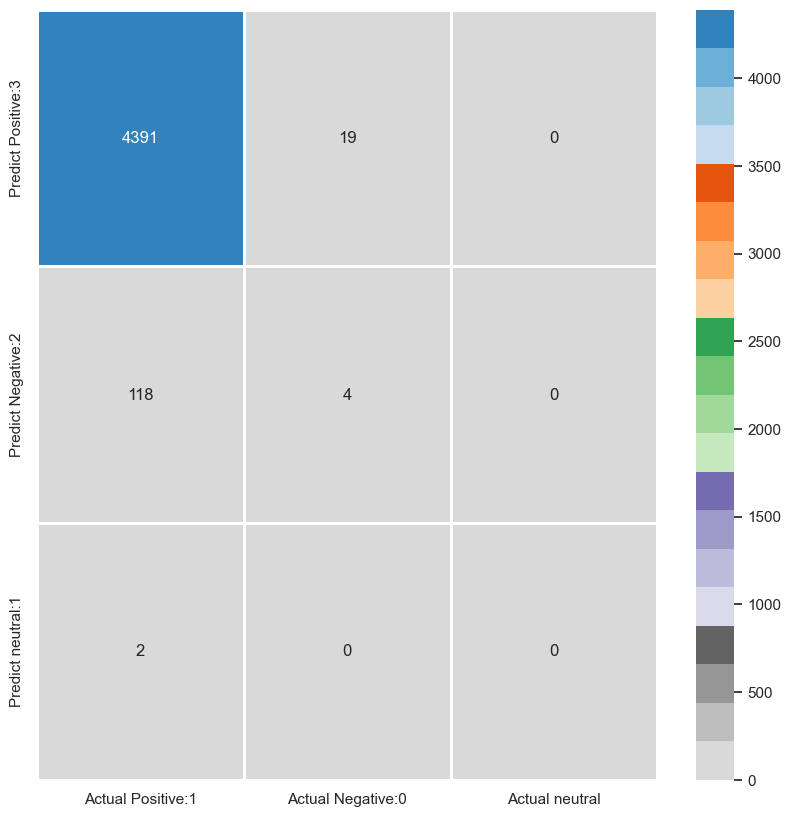

In [47]:
confusion_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0','Actual neutral'], 
                                 index=['Predict Positive:3', 'Predict Negative:2','Predict neutral:1'])

sns.heatmap(confusion_matrix, annot=True, fmt='d',linewidths=1.0, cmap='tab20c_r')